<strong>Lie Reubensto</strong> <br>
<strong>Speech & Audio Processing Project 2</strong> <br>
<strong>Run in Kaggle</strong>

## <h2><strong>Wav2Vec 2.0 for Audio Feature Extraction in English Accent Classification</strong></h2>

Dataset Link: <br>
https://www.kaggle.com/datasets/mozillaorg/common-voice

In [2]:
!pip install -q evaluate # For evaluation
!pip install -U -q datasets # For Dataset handling

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 3.2 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import gc
from tqdm import tqdm
tqdm.pandas()
import torch
import torchaudio
import logging
import evaluate
from pathlib import Path
from transformers import AutoModelForAudioClassification, AutoFeatureExtractor, TrainingArguments, Trainer, pipeline
from imblearn.under_sampling import RandomUnderSampler
from datasets import Dataset
from sklearn.metrics import roc_auc_score, classification_report
from IPython.display import Audio

In [4]:
import warnings 
warnings.filterwarnings("ignore")

In [5]:
# Initialize Constants
RANDOM_STATE = 42
SAMPLING_RATE = 16000
BATCH_SIZE = 8
MAX_SECONDS = 3
MAX_LENGTH = SAMPLING_RATE * MAX_SECONDS

In [6]:
# Load Data
use_cols = ['filename', 'accent']
df_meta_valid_train = pd.read_csv("/kaggle/input/common-voice/cv-valid-train.csv", usecols=use_cols)
df_meta_valid_test = pd.read_csv("/kaggle/input/common-voice/cv-valid-test.csv", usecols=use_cols)

In [7]:
df_meta_valid_train.head()

,filename,accent
0,cv-valid-train/sample-000000.mp3,NaN
1,cv-valid-train/sample-000001.mp3,NaN
2,cv-valid-train/sample-000002.mp3,NaN
3,cv-valid-train/sample-000003.mp3,NaN
4,cv-valid-train/sample-000004.mp3,NaN


In [8]:
# Filter data based on accent label
filter_language = ['us', 'australia', 'england']
df_filter_valid_train = df_meta_valid_train[df_meta_valid_train['accent'].isin(filter_language)]
gc.collect()
df_filter_valid_test = df_meta_valid_test[df_meta_valid_test['accent'].isin(filter_language)]
gc.collect()

0

In [9]:
df_filter_valid_train['accent'].value_counts()

accent
us           30997
england      14938
australia     4287
Name: count, dtype: int64

In [10]:
df_filter_valid_test['accent'].value_counts()

accent
us           633
england      299
australia     93
Name: count, dtype: int64

In [11]:
undersample = RandomUnderSampler(random_state=RANDOM_STATE, sampling_strategy='not minority')

In [12]:
# Undersample the training data according to the minority class
y = df_filter_valid_train[['accent']]
df_filter_valid_train = df_filter_valid_train.drop(['accent'], axis=1)
df_filter_valid_train, y_new = undersample.fit_resample(df_filter_valid_train, y)
del y
df_filter_valid_train['accent'] = y_new
del y_new
gc.collect()

0

In [13]:
df_filter_valid_train['accent'].value_counts()

accent
australia    4287
england      4287
us           4287
Name: count, dtype: int64

In [14]:
# Function for getting the full path of the audio
def get_full_path(category):
    file_list = []
    full_list = []

    for file in tqdm(Path('/kaggle/input/common-voice/').glob(f'cv-valid-{category}/*/*.mp3')):
        full_path = str(file)
        file_name = '/'.join(str(file).split('/')[-2:])
        file_list.append(file_name)
        full_list.append(full_path)

    df = pd.DataFrame()
    df['filename'] = file_list
    df['file'] = full_list

    return df

In [15]:
full_path_train = get_full_path("train")
gc.collect()
full_path_test = get_full_path("test")
gc.collect()

195776it [00:02, 84496.63it/s] 
3995it [00:00, 80469.11it/s]


0

In [16]:
# Join the original df with the full_path df
df_filter_valid_train = df_filter_valid_train.merge(full_path_train, on='filename', how='inner')
gc.collect()
df_filter_valid_test = df_filter_valid_test.merge(full_path_test, on='filename', how='inner')
gc.collect()

0

In [17]:
df_filter_valid_train.head()

,filename,accent,file
0,cv-valid-train/sample-000019.mp3,australia,/kaggle/input/common-voice/cv-valid-train/cv-v...
1,cv-valid-train/sample-000026.mp3,australia,/kaggle/input/common-voice/cv-valid-train/cv-v...
2,cv-valid-train/sample-000027.mp3,australia,/kaggle/input/common-voice/cv-valid-train/cv-v...
3,cv-valid-train/sample-000036.mp3,australia,/kaggle/input/common-voice/cv-valid-train/cv-v...
4,cv-valid-train/sample-000049.mp3,australia,/kaggle/input/common-voice/cv-valid-train/cv-v...


In [18]:
# Create dictionaries for label and id conversion
label2id, id2label = dict(), dict()

for i, label in enumerate(filter_language):
    label2id[label] = i
    id2label[i] = label

print(f"Mapping of IDs to Labels: {id2label}")
print(f"Mapping of Labels to IDs: {label2id}")

Mapping of IDs to Labels: {0: 'us', 1: 'australia', 2: 'england'}
Mapping of Labels to IDs: {'us': 0, 'australia': 1, 'england': 2}


In [19]:
# Make a new column to map the label based on accent
df_filter_valid_train['labels'] = df_filter_valid_train['accent'].apply(lambda x: label2id[x])
gc.collect()
df_filter_valid_test['labels'] = df_filter_valid_test['accent'].apply(lambda x: label2id[x])
gc.collect()

df_filter_valid_train = df_filter_valid_train[['filename', 'file', 'labels']]
gc.collect()
df_filter_valid_test = df_filter_valid_test[['filename', 'file', 'labels']]
gc.collect()

0

In [20]:
df_filter_valid_train.head()

,filename,file,labels
0,cv-valid-train/sample-000019.mp3,/kaggle/input/common-voice/cv-valid-train/cv-v...,1
1,cv-valid-train/sample-000026.mp3,/kaggle/input/common-voice/cv-valid-train/cv-v...,1
2,cv-valid-train/sample-000027.mp3,/kaggle/input/common-voice/cv-valid-train/cv-v...,1
3,cv-valid-train/sample-000036.mp3,/kaggle/input/common-voice/cv-valid-train/cv-v...,1
4,cv-valid-train/sample-000049.mp3,/kaggle/input/common-voice/cv-valid-train/cv-v...,1


In [21]:
# Function to get audio
def get_audio(file):
    audio, rate = torchaudio.load(str(file))
    
    transform = torchaudio.transforms.Resample(rate, SAMPLING_RATE)
    audio = transform(audio).squeeze(0).numpy().reshape(-1)
    audio = audio[:MAX_LENGTH]
    
    return audio

In [22]:
df_filter_valid_train['audio'] = df_filter_valid_train['file'].progress_apply(get_audio)
gc.collect()
df_filter_valid_test['audio'] = df_filter_valid_test['file'].progress_apply(get_audio)
gc.collect()

100%|██████████| 1025/1025 [00:11<00:00, 89.78it/s]


0

In [23]:
# Drop column filename and file
df_audio_valid_train = df_filter_valid_train.drop(['filename', 'file'], axis=1)
gc.collect()
df_audio_valid_test = df_filter_valid_test.drop(['filename', 'file'], axis=1)
gc.collect()

df_audio_valid_train = df_audio_valid_train[['audio', 'labels']]
df_audio_valid_test = df_audio_valid_test[['audio', 'labels']]

In [24]:
df_audio_valid_train.head()

,audio,labels
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1
1,"[6.493607e-13, 1.2094373e-12, -4.039878e-12, -...",1
2,"[-9.000653e-15, -6.3768755e-13, 4.2793944e-14,...",1
3,"[2.932807e-13, 1.9925335e-13, -8.8261825e-13, ...",1
4,"[-2.4941545e-13, -6.7623543e-13, -1.0092004e-1...",1


In [25]:
# Format the df to Dataset
train_dataset = Dataset.from_pandas(df_audio_valid_train)
gc.collect()
test_dataset = Dataset.from_pandas(df_audio_valid_test)
gc.collect()

15

In [26]:
print(train_dataset)
print(test_dataset)

Dataset({
    features: ['audio', 'labels'],
    num_rows: 12861
})
Dataset({
    features: ['audio', 'labels'],
    num_rows: 1025
})


In [27]:
# Load Model and Feature Extractor
model_origin = "facebook/wav2vec2-large-xlsr-53"
feature_extractor = AutoFeatureExtractor.from_pretrained(model_origin)
model = AutoModelForAudioClassification.from_pretrained(model_origin, num_labels=len(filter_language))
model.config.id2label = id2label

preprocessor_config.json:   0%|          | 0.00/212 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.77k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.27G [00:00<?, ?B/s]

Some weights of Wav2Vec2ForSequenceClassification were not initialized from the model checkpoint at facebook/wav2vec2-large-xlsr-53 and are newly initialized: ['classifier.bias', 'classifier.weight', 'projector.bias', 'projector.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [28]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

Wav2Vec2ForSequenceClassification(
  (wav2vec2): Wav2Vec2Model(
    (feature_extractor): Wav2Vec2FeatureEncoder(
      (conv_layers): ModuleList(
        (0): Wav2Vec2LayerNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (1-4): 4 x Wav2Vec2LayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (5-6): 2 x Wav2Vec2LayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): Wav2Vec2FeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=

In [29]:
# Preprocessing function for audio
def preprocess_function(batch):
    inputs = feature_extractor(batch['audio'], sampling_rate=SAMPLING_RATE, max_length=MAX_LENGTH, truncation=True)
    return inputs

In [30]:
train_dataset = train_dataset.map(preprocess_function, remove_columns="audio", batched=True, batch_size=BATCH_SIZE)
gc.collect()
test_dataset = test_dataset.map(preprocess_function, remove_columns="audio", batched=True, batch_size=BATCH_SIZE)
gc.collect()

Map:   0%|          | 0/12861 [00:00<?, ? examples/s]

Map:   0%|          | 0/1025 [00:00<?, ? examples/s]

22

In [31]:
print(train_dataset)

Dataset({
    features: ['labels', 'input_values', 'attention_mask'],
    num_rows: 12861
})


In [32]:
# Extra metrics to be evaluated
accuracy = evaluate.load("accuracy")

def compute_metrics(eval_pred):
    predictions = eval_pred.predictions
    predictions = np.exp(predictions)/np.exp(predictions).sum(axis=1, keepdims=True)
    label_ids = eval_pred.label_ids
    
    roc_auc = roc_auc_score(label_ids, predictions, average='macro', multi_class='ovr')
    acc_score = accuracy.compute(predictions=predictions.argmax(axis=1), references=label_ids)['accuracy']
    
    return {"roc_auc": roc_auc, "accuracy": acc_score}

In [33]:
# Training preparation
warmup_steps = 50
warmup_ratio = 0.1
weight_decay = 0.01
num_train_epochs = 10
model_name = "accent_classification"

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

training_args = TrainingArguments(
    output_dir=model_name,
    logging_dir='./logs',
    num_train_epochs=num_train_epochs,
    per_device_train_batch_size=BATCH_SIZE,
    per_device_eval_batch_size=BATCH_SIZE,
    learning_rate=1e-4,
    logging_strategy='epoch',
    logging_first_step=True,
    logging_steps=10,
    evaluation_strategy='epoch',
    warmup_steps=warmup_steps,
    warmup_ratio = warmup_ratio,
    weight_decay=weight_decay,
    gradient_accumulation_steps=4,
    gradient_checkpointing=True,
    save_strategy='epoch',
    save_total_limit=1,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    report_to='none',
    fp16=True
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=feature_extractor,
    compute_metrics=compute_metrics
)

In [34]:
# Test Base Model
trainer.evaluate()

{'eval_loss': 1.099962830543518,
 'eval_model_preparation_time': 0.0059,
 'eval_roc_auc': 0.47773431320272325,
 'eval_accuracy': 0.2917073170731707,
 'eval_runtime': 62.8415,
 'eval_samples_per_second': 16.311,
 'eval_steps_per_second': 2.053}

In [35]:
# Train Model
trainer.train()

Epoch,Training Loss,Validation Loss,Model Preparation Time,Roc Auc,Accuracy
1,1.036200,0.760339,0.005900,0.838879,0.705366
2,0.713700,0.429231,0.005900,0.938242,0.831220
3,0.458200,0.430227,0.005900,0.949272,0.833171
4,0.347600,0.320117,0.005900,0.963514,0.882927
5,0.243400,0.377904,0.005900,0.969354,0.871220
6,0.188700,0.321762,0.005900,0.969106,0.888780
7,0.149100,0.380488,0.005900,0.968036,0.873171
8,0.123100,0.409845,0.005900,0.968093,0.889756
9,0.104600,0.437738,0.005900,0.970667,0.885854
10,0.079700,0.537680,0.005900,0.969436,0.877073


TrainOutput(global_step=4020, training_loss=0.3444459412228409, metrics={'train_runtime': 16115.9706, 'train_samples_per_second': 7.98, 'train_steps_per_second': 0.249, 'total_flos': 1.1693473741965859e+19, 'train_loss': 0.3444459412228409, 'epoch': 10.0})

In [36]:
# Test Trained Model
trainer.evaluate()

{'eval_loss': 0.4098452925682068,
 'eval_model_preparation_time': 0.0059,
 'eval_roc_auc': 0.9680926363908005,
 'eval_accuracy': 0.8897560975609756,
 'eval_runtime': 61.7193,
 'eval_samples_per_second': 16.607,
 'eval_steps_per_second': 2.09,
 'epoch': 10.0}

In [37]:
# Get prediction and real values
outputs = trainer.predict(test_dataset)
y_true = outputs.label_ids
y_pred = outputs.predictions.argmax(1)

In [38]:
print("Classification Report:\n")
print(classification_report(y_true, y_pred))

Classification Report:

              precision    recall  f1-score   support

           0       0.91      0.95      0.93       633
           1       0.73      0.77      0.75        93
           2       0.90      0.80      0.85       299

    accuracy                           0.89      1025
   macro avg       0.85      0.84      0.84      1025
weighted avg       0.89      0.89      0.89      1025



In [39]:
# Save Trained Model
trainer.save_model()

In [40]:
# Pipeline for audio classification
pipe = pipeline('audio-classification', model=model_name, device=0)

In [41]:
# us
audio, rate = torchaudio.load('/kaggle/input/common-voice/cv-valid-test/cv-valid-test/sample-000003.mp3')
transform = torchaudio.transforms.Resample(rate, SAMPLING_RATE)
audio = transform(audio).numpy().reshape(-1)
pipe(audio)

[{'score': 0.6173049211502075, 'label': 'england'},
 {'score': 0.38008004426956177, 'label': 'us'},
 {'score': 0.0026150003541260958, 'label': 'australia'}]

In [42]:
Audio(audio, rate=SAMPLING_RATE)

In [43]:
# england
audio, rate = torchaudio.load('/kaggle/input/common-voice/cv-valid-test/cv-valid-test/sample-000008.mp3')
transform = torchaudio.transforms.Resample(rate, SAMPLING_RATE)
audio = transform(audio).numpy().reshape(-1)
pipe(audio)

[{'score': 0.995879054069519, 'label': 'england'},
 {'score': 0.003155400278046727, 'label': 'australia'},
 {'score': 0.0009655322064645588, 'label': 'us'}]

In [44]:
Audio(audio, rate=SAMPLING_RATE)

In [45]:
# australia
audio, rate = torchaudio.load('/kaggle/input/common-voice/cv-valid-test/cv-valid-test/sample-000065.mp3')
transform = torchaudio.transforms.Resample(rate,SAMPLING_RATE)
audio = transform(audio).numpy().reshape(-1)
pipe(audio)

[{'score': 0.9997460246086121, 'label': 'australia'},
 {'score': 0.00014589785132557154, 'label': 'england'},
 {'score': 0.00010808346269186586, 'label': 'us'}]

In [46]:
Audio(audio, rate=SAMPLING_RATE)

## <h2><strong>Automatic Speech Recognition using OpenAI Whisper and FLEURS Dataset</strong></h2>

Based on the notebook: <br>
https://github.com/openai/whisper/blob/main/notebooks/Multilingual_ASR.ipynb

<strong>Installing Whisper</strong>

The commands below will install the Python packages needed to use Whisper models and evaluate the transcription results.

In [1]:
!pip install -q git+https://github.com/openai/whisper.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.5/209.5 MB 8.0 MB/s eta 0:00:000:00:0100:01


In [2]:
import io
import os
import numpy as np

try:
    import tensorflow  # required in Colab to avoid protobuf compatibility issues
except ImportError:
    pass

import torch
import pandas as pd
import urllib
import tarfile
import whisper
import torchaudio

from scipy.io import wavfile
from tqdm.notebook import tqdm

pd.options.display.max_rows = 100
pd.options.display.max_colwidth = 1000
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

<strong>Loading the Fleurs dataset</strong>

Select the language of the Fleur dataset to download. Please note that the transcription and translation performance varies widely depending on the language. Appendix D.2 in the paper contains the performance breakdown by language.

In [3]:
import ipywidgets as widgets

languages = {"af_za": "Afrikaans", "am_et": "Amharic", "ar_eg": "Arabic", "as_in": "Assamese", "az_az": "Azerbaijani", "be_by": "Belarusian", "bg_bg": "Bulgarian", "bn_in": "Bengali", "bs_ba": "Bosnian", "ca_es": "Catalan", "cmn_hans_cn": "Chinese", "cs_cz": "Czech", "cy_gb": "Welsh", "da_dk": "Danish", "de_de": "German", "el_gr": "Greek", "en_us": "English", "es_419": "Spanish", "et_ee": "Estonian", "fa_ir": "Persian", "fi_fi": "Finnish", "fil_ph": "Tagalog", "fr_fr": "French", "gl_es": "Galician", "gu_in": "Gujarati", "ha_ng": "Hausa", "he_il": "Hebrew", "hi_in": "Hindi", "hr_hr": "Croatian", "hu_hu": "Hungarian", "hy_am": "Armenian", "id_id": "Indonesian", "is_is": "Icelandic", "it_it": "Italian", "ja_jp": "Japanese", "jv_id": "Javanese", "ka_ge": "Georgian", "kk_kz": "Kazakh", "km_kh": "Khmer", "kn_in": "Kannada", "ko_kr": "Korean", "lb_lu": "Luxembourgish", "ln_cd": "Lingala", "lo_la": "Lao", "lt_lt": "Lithuanian", "lv_lv": "Latvian", "mi_nz": "Maori", "mk_mk": "Macedonian", "ml_in": "Malayalam", "mn_mn": "Mongolian", "mr_in": "Marathi", "ms_my": "Malay", "mt_mt": "Maltese", "my_mm": "Myanmar", "nb_no": "Norwegian", "ne_np": "Nepali", "nl_nl": "Dutch", "oc_fr": "Occitan", "pa_in": "Punjabi", "pl_pl": "Polish", "ps_af": "Pashto", "pt_br": "Portuguese", "ro_ro": "Romanian", "ru_ru": "Russian", "sd_in": "Sindhi", "sk_sk": "Slovak", "sl_si": "Slovenian", "sn_zw": "Shona", "so_so": "Somali", "sr_rs": "Serbian", "sv_se": "Swedish", "sw_ke": "Swahili", "ta_in": "Tamil", "te_in": "Telugu", "tg_tj": "Tajik", "th_th": "Thai", "tr_tr": "Turkish", "uk_ua": "Ukrainian", "ur_pk": "Urdu", "uz_uz": "Uzbek", "vi_vn": "Vietnamese", "yo_ng": "Yoruba"}

selection = widgets.Dropdown(
    options=[("Select language", None), ("----------", None)] + sorted([(f"{v} ({k})", k) for k, v in languages.items()]),
    value="id_id",
    description='Language:',
    disabled=False
)

selection

Dropdown(description='Language:', index=32, options=(('Select language', None), ('----------', None), ('Afrika…

In [4]:
lang = selection.value
language = languages[lang]

assert lang is not None, "Please select a language"
print(f"Selected language: {language} ({lang})")

Selected language: Indonesian (id_id)


In [5]:
def download(url: str, target_path: str):
    with urllib.request.urlopen(url) as source, open(target_path, "wb") as output:
        with tqdm(total=int(source.info().get("Content-Length")), ncols=80, unit='iB', unit_scale=True, unit_divisor=1024) as loop:
            while True:
                buffer = source.read(8192)
                if not buffer:
                    break

                output.write(buffer)
                loop.update(len(buffer))


class Fleurs(torch.utils.data.Dataset):
    """
    A simple class to wrap Fleurs and subsample a portion of the dataset as needed.
    """
    def __init__(self, lang, split="test", subsample_rate=1, device=DEVICE):
        url = f"https://storage.googleapis.com/xtreme_translations/FLEURS102/{lang}.tar.gz"
        tar_path = os.path.expanduser(f"~/.cache/fleurs/{lang}.tgz")
        os.makedirs(os.path.dirname(tar_path), exist_ok=True)

        if not os.path.exists(tar_path):
            download(url, tar_path)

        all_audio = {}
        with tarfile.open(tar_path, "r:gz") as tar:
            for member in tar.getmembers():
                name = member.name
                if name.endswith(f"{split}.tsv"):
                    labels = pd.read_table(tar.extractfile(member), names=("id", "file_name", "raw_transcription", "transcription", "_", "num_samples", "gender"))

                if f"/{split}/" in name and name.endswith(".wav"):
                    audio_bytes = tar.extractfile(member).read()
                    all_audio[os.path.basename(name)] = wavfile.read(io.BytesIO(audio_bytes))[1]                    

        self.labels = labels.to_dict("records")[::subsample_rate]
        self.all_audio = all_audio
        self.device = device

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, item):
        record = self.labels[item]
        audio = torch.from_numpy(self.all_audio[record["file_name"]].copy())
        text = record["transcription"]
        
        return (audio, text)

In [6]:
dataset = Fleurs(lang, subsample_rate=10)  # subsample 10% of the dataset for a quick demo

  0%|                                              | 0.00/2.21G [00:00<?, ?iB/s]

<strong>Running inference on the dataset using a medium Whisper model</strong>

The following will take a few minutes to transcribe and translate utterances in the dataset.

In [7]:
model = whisper.load_model("medium")
print(
    f"Model is {'multilingual' if model.is_multilingual else 'English-only'} "
    f"and has {sum(np.prod(p.shape) for p in model.parameters()):,} parameters."
)

100%|█████████████████████████████████████| 1.42G/1.42G [00:18<00:00, 82.3MiB/s]
/usr/local/lib/python3.10/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

Model is multilingual and has 762,321,920 parameters.


In [8]:
options = dict(language=language, beam_size=5, best_of=5)
transcribe_options = dict(task="transcribe", **options)
translate_options = dict(task="translate", **options)

In [9]:
references = []
transcriptions = []
translations = []

for audio, text in tqdm(dataset):
    transcription = model.transcribe(audio, **transcribe_options)["text"]
    translation = model.transcribe(audio, **translate_options)["text"]
    
    transcriptions.append(transcription)
    translations.append(translation)
    references.append(text)

  0%|          | 0/69 [00:00<?, ?it/s]

In [10]:
data = pd.DataFrame(dict(reference=references, transcription=transcriptions, translation=translations))
data

,reference,transcription,translation
0,strategi tersebut terbukti efektif memutus pasokan penting militer dan sipil meskipun blokade ini melanggar hukum internasional yang diterima secara umum yang dikodifikasi oleh beberapa perjanjian internasional selama dua abad terakhir,"Strategi tersebut terbukti efektif, memutus pasokan penting militer dan sipil, meskipun blokade ini melanggar hukum internasional yang diterima secara umum yang dikodifikasi oleh beberapa perjanjian internasional selama dua abad terakhir.","The strategy is proven effective, cutting off the importance of military and civilian troops. Although this blockade violates international law, which is generally accepted, which has been codified by several international agreements for the last two centuries."
1,namun ada banyak hal tentang burung yang masih terlihat seperti dinosaurus,"Namun, ada banyak hal tentang burung yang masih terlihat seperti dinosaurus.","However, there are many things about birds that still look like dinosaurs."
2,perdebatan dipicu kontroversi terkait pengeluaran dana bantuan dan rekonstruksi pasca-badai katrina yang dilabeli oleh kelompok konservatif fiskal sebagai kesepakatan new orleans bush,Perdebatan dipicu kontroversi terkait mengeluaran dana bantuan dan rekonstruksi pasca badai Katrina yang dilabeli oleh kelompok konservatif fiskal sebagai kesepakatan New Orleans Bush.,The debate was controversial regarding the release of help fund and reconstruction of PASCA Badai Katrina which was labeled by the conservative group as New Orleans Bush's partnership.
3,pengumuman itu dibuat setelah trump melakukan percakapan telepon dengan presiden turki recep tayyip erdoäÿan,Pengumuman itu dibuat setelah Trump melakukan percakapan telepon dengan Presiden Turki Recep Tayyip Erdogan.,The announcement was made after Trump made a phone conversation with Turkish President Recep Tayyip Erdogan.
4,area yang luas di sebelah utara sangat jarang ditempati dan beberapa bahkan adalah hutan belantara yang hampir tak dapat ditempati,area yang luas di sebelah utara sangat jarang ditempati dan beberapa bahkan adalah hutan pelantara yang hampir tak dapat ditempati,"The large area on the north side is very rare to be located, and some even are desert forests that are almost impossible to be located."
5,jadi notasi itu kemungkinan besar disisipkan cuma sebagai label,"Jadi, notasi itu kemungkinan besar disisitkan cuma sebagai level.","So, the notation is likely to be used only as a level."
6,namun karena ditempatkan di dataran tinggi tropis hanya beberapa derajat di utara khatulistiwa anda perlu berurusan dengan panas selalu maupun matahari yang kuat ketika langit cerah lebih jarang.\t n a m u n | k a r e n a | d i t e m p a t k a n | d i | d a t a r a n | t i n g g i | t r o p i s | h a n y a | b e b e r a p a | d e r a j a t | d i | u t a r a | k h a t u l i s t i w a | a n d a | p e r l u | b e r u r u s a n | d e n g a n | p a n a s | s e l a l u | m a u p u n | m a t a h a r i | y a n g | k u a t | k e t i k a | l a n g i t | c e r a h | l e b i h | j a r a n g . |,"Namun, karena ditempatkan di dataran tinggi tropis hanya beberapa derajat di utara katulistiwa, Anda perlu berurusan dengan panas selalu maupun matahari yang kuat ketika langit cerah lebih jarang.","However, because it is located on a tropical highland, only a few degrees in the north of the Tewa River, you need to take care of it hot, always, even the strong sun when the sky is bright, more rarely."
7,satelit itu dikirim ke luar angkasa oleh roket ilmuwan menggunakan teleskop di luar angkasa karena atmosfer bumi mengubah sebagian cahaya dan pandangan kita,Satelit itu dikirim ke luar angkasa oleh roket ilmuwan menggunakan teleskop di luar angkasa karena atas mosfair bumi mengubah sebagian cahaya dan pandangan kita.,The satellite was sent to outer space by rocket Ilmuan using a telescope in outer space because Earth's atmosphere changes some of our light and view.
8,jangan mencoreng situs dengan mencorat

<strong>Word-level timestamps using attention weights</strong>

Below, we use the cross-attention weights to determine more granular, word-level timestamps. It uses a set of heuristics and dynamic time warping (DTW) to find the alignment between the audio and the transcript.

In [11]:
!pip install -q dtw-python

/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.7/764.7 kB 19.6 MB/s eta 0:00:0000:01


In [12]:
import string
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.ticker as ticker

from IPython.display import display, HTML
from whisper.tokenizer import get_tokenizer
from dtw import dtw
from scipy.ndimage import median_filter

%matplotlib inline
%config InlineBackend.figure_format = "retina"

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [13]:
AUDIO_SAMPLES_PER_TOKEN = whisper.audio.HOP_LENGTH * 2
AUDIO_TIME_PER_TOKEN = AUDIO_SAMPLES_PER_TOKEN / whisper.audio.SAMPLE_RATE

medfilt_width = 7
qk_scale = 1.0

tokenizer = get_tokenizer(model.is_multilingual, language=languages[lang])

In [14]:
# This part downloads a repackaged version of the Noto Sans font (either CJK or non-CJK)
# to render various languages in Matplotlib figures.

if languages[lang] in {"Chinese", "Japanese", "Korean"}:
    font = "GoNotoCJKCore.ttf"
else:
    font = "GoNotoCurrent.ttf"

font_release = "https://github.com/satbyy/go-noto-universal/releases/download/v5.2"
if not os.path.exists(font):
    download(f"{font_release}/{font}", font)

prop = fm.FontProperties(fname=font)
props = {'fontproperties': prop}

  0%|                                              | 0.00/14.2M [00:00<?, ?iB/s]

In [15]:
def split_tokens_on_unicode(tokens: torch.Tensor):
    words = []
    word_tokens = []
    current_tokens = []
    
    for token in tokens.tolist():
        current_tokens.append(token)
        decoded = tokenizer.decode_with_timestamps(current_tokens)
        if "\ufffd" not in decoded:
            words.append(decoded)
            word_tokens.append(current_tokens)
            current_tokens = []
    
    return words, word_tokens

In [16]:
def split_tokens_on_spaces(tokens: torch.Tensor):
    subwords, subword_tokens_list = split_tokens_on_unicode(tokens)
    words = []
    word_tokens = []
    
    for subword, subword_tokens in zip(subwords, subword_tokens_list):
        special = subword_tokens[0] >= tokenizer.eot
        with_space = subword.startswith(" ")
        punctuation = subword.strip() in string.punctuation
        if special or with_space or punctuation:
            words.append(subword)
            word_tokens.append(subword_tokens)
        else:
            words[-1] = words[-1] + subword
            word_tokens[-1].extend(subword_tokens)
    
    return words, word_tokens

In [17]:
if languages[lang] in {"Chinese", "Japanese", "Thai", "Lao", "Myanmar"}:
    # These languages don't typically use spaces, so it is difficult to split words
    # without morpheme analysis. Here, we instead split words at any
    # position where the tokens are decoded as valid unicode points
    split_tokens = split_tokens_on_unicode
else:
    split_tokens = split_tokens_on_spaces

In [18]:
# install hooks on the cross attention layers to retrieve the attention weights
QKs = [None] * model.dims.n_text_layer

for i, block in enumerate(model.decoder.blocks):
    block.cross_attn.register_forward_hook(
        lambda _, ins, outs, index=i: QKs.__setitem__(index, outs[-1])
    )

 Strategi tersebut terbukti efektif, memutus pasokan penting militer dan sipil, meskipun blokade ini melanggar hukum internasional yang diterima secara umum yang dikodifikasi oleh beberapa perjanjian internasional selama dua abad terakhir.


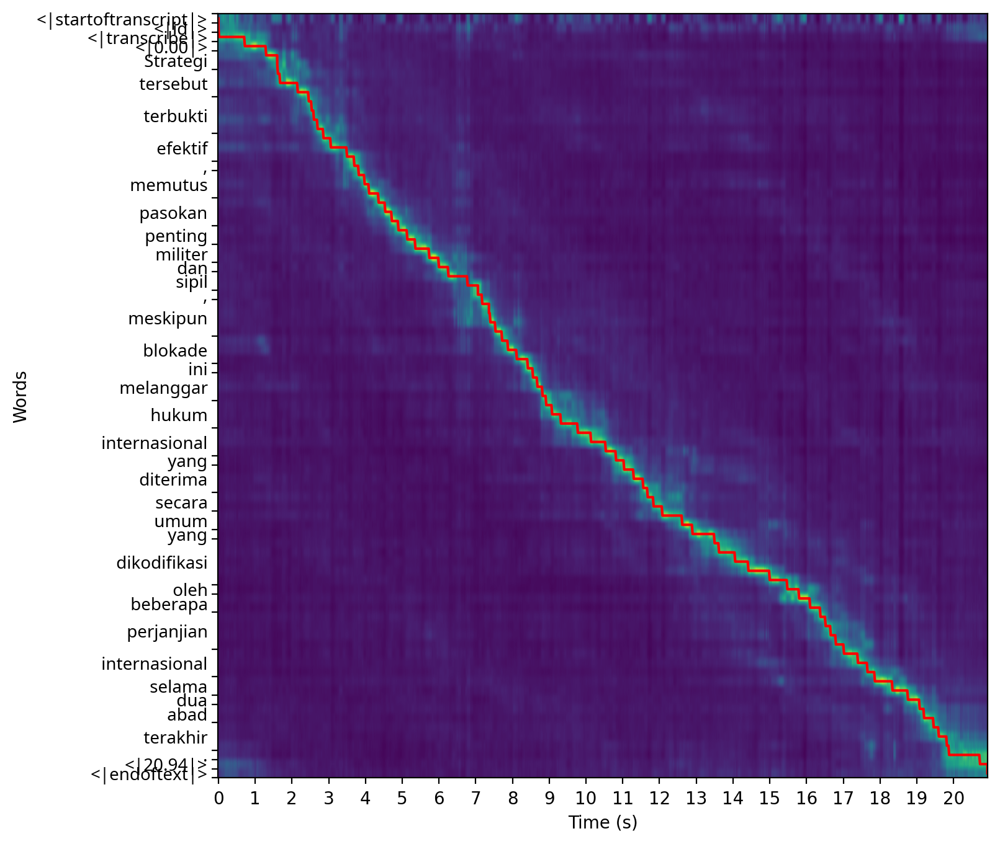

,word,begin,end
0,Strategi,1.30,1.62
1,tersebut,1.62,2.46
2,terbukti,2.46,2.86
3,efektif,2.86,3.70
4,memutus,3.82,4.36
5,pasokan,4.36,4.90
6,penting,4.90,5.36
7,militer,5.36,6.00
8,dan,6.00,6.26
9,sipil,6.26,7.06


 Namun, ada banyak hal tentang burung yang masih terlihat seperti dinosaurus.


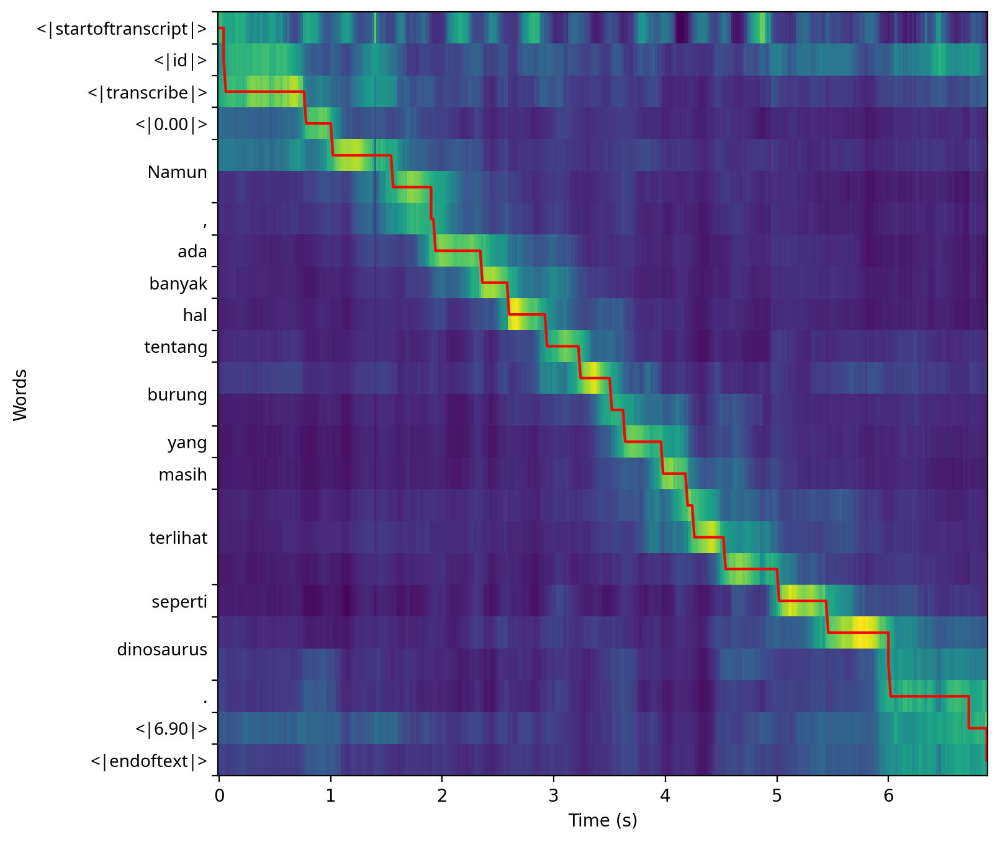

,word,begin,end
0,Namun,1.02,1.90
1,ada,1.94,2.36
2,banyak,2.36,2.60
3,hal,2.60,2.94
4,tentang,2.94,3.24
5,burung,3.24,3.64
6,yang,3.64,3.98
7,masih,3.98,4.20
8,terlihat,4.20,5.02
9,seperti,5.02,5.46


 Perdebatan dipicu kontroversi terkait mengeluaran dana bantuan dan rekonstruksi pasca badai Katrina yang dilabeli oleh kelompok konservatif fiskal sebagai kesepakatan New Orleans Bush.


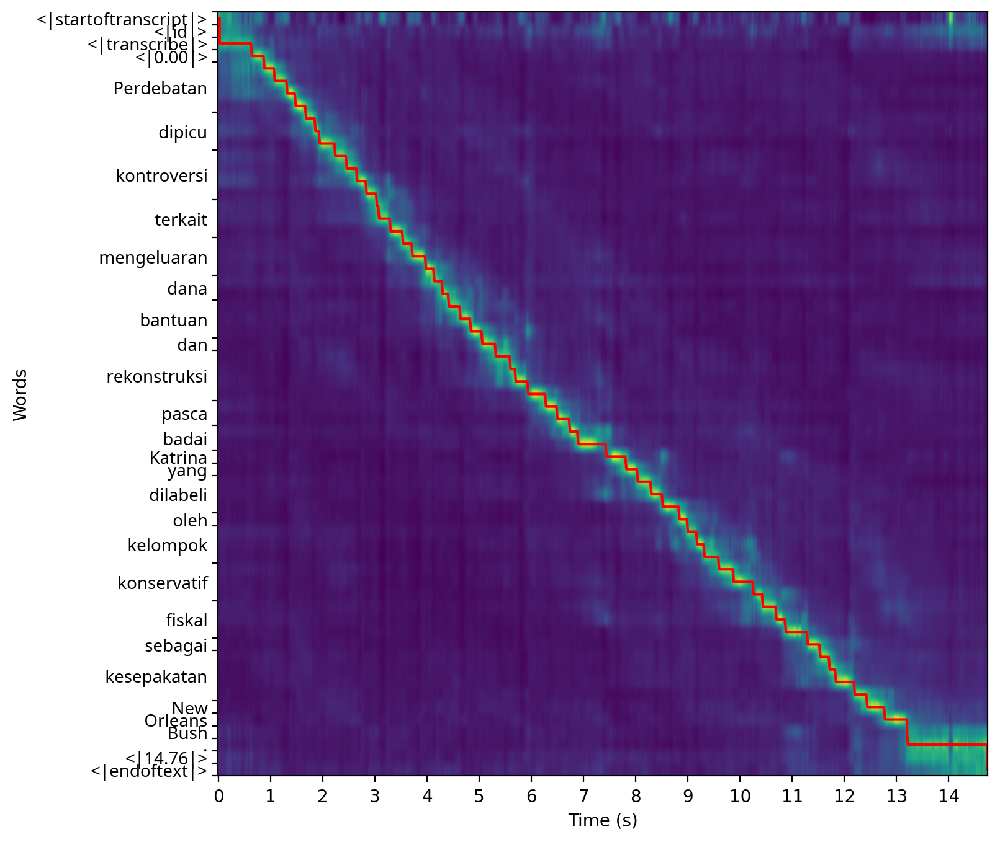

,word,begin,end
0,Perdebatan,0.88,1.68
1,dipicu,1.68,2.24
2,kontroversi,2.24,3.04
3,terkait,3.04,3.54
4,mengeluaran,3.54,4.14
5,dana,4.14,4.42
6,bantuan,4.42,5.06
7,dan,5.06,5.32
8,rekonstruksi,5.32,6.28
9,pasca,6.28,6.74


 Pengumuman itu dibuat setelah Trump melakukan percakapan telepon dengan Presiden Turki Recep Tayyip Erdogan.


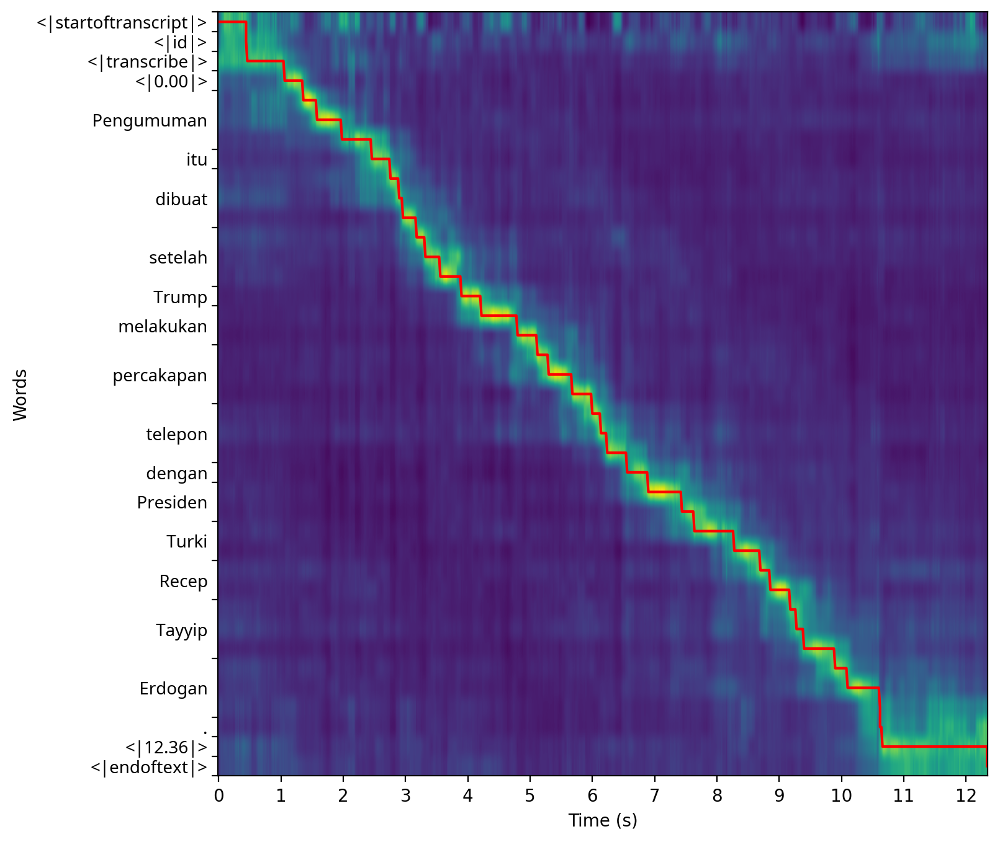

,word,begin,end
0,Pengumuman,1.36,2.46
1,itu,2.46,2.76
2,dibuat,2.76,3.18
3,setelah,3.18,3.90
4,Trump,3.90,4.22
5,melakukan,4.22,5.12
6,percakapan,5.12,6.00
7,telepon,6.00,6.56
8,dengan,6.56,6.90
9,Presiden,6.90,7.64


 area yang luas di sebelah utara sangat jarang ditempati dan beberapa bahkan adalah hutan pelantara yang hampir tak dapat ditempati


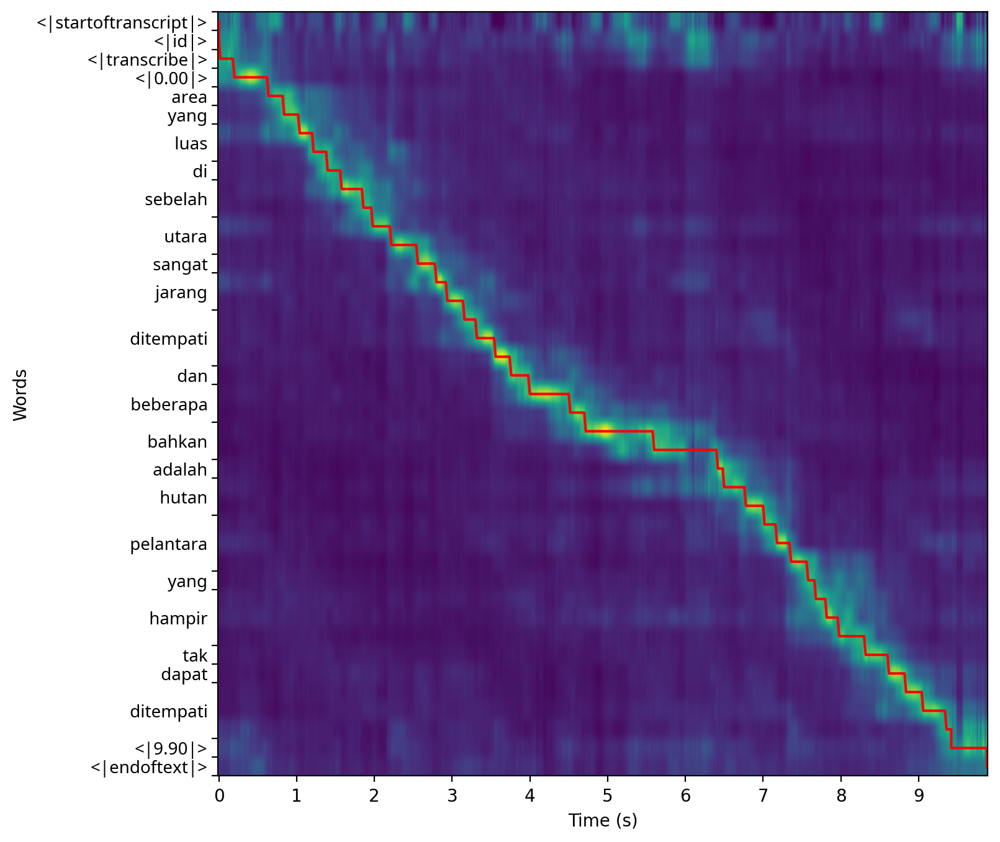

,word,begin,end
0,area,0.64,0.84
1,yang,0.84,1.04
2,luas,1.04,1.40
3,di,1.40,1.58
4,sebelah,1.58,1.98
5,utara,1.98,2.56
6,sangat,2.56,2.80
7,jarang,2.80,3.16
8,ditempati,3.16,3.76
9,dan,3.76,4.00


 Jadi, notasi itu kemungkinan besar disisitkan cuma sebagai level.


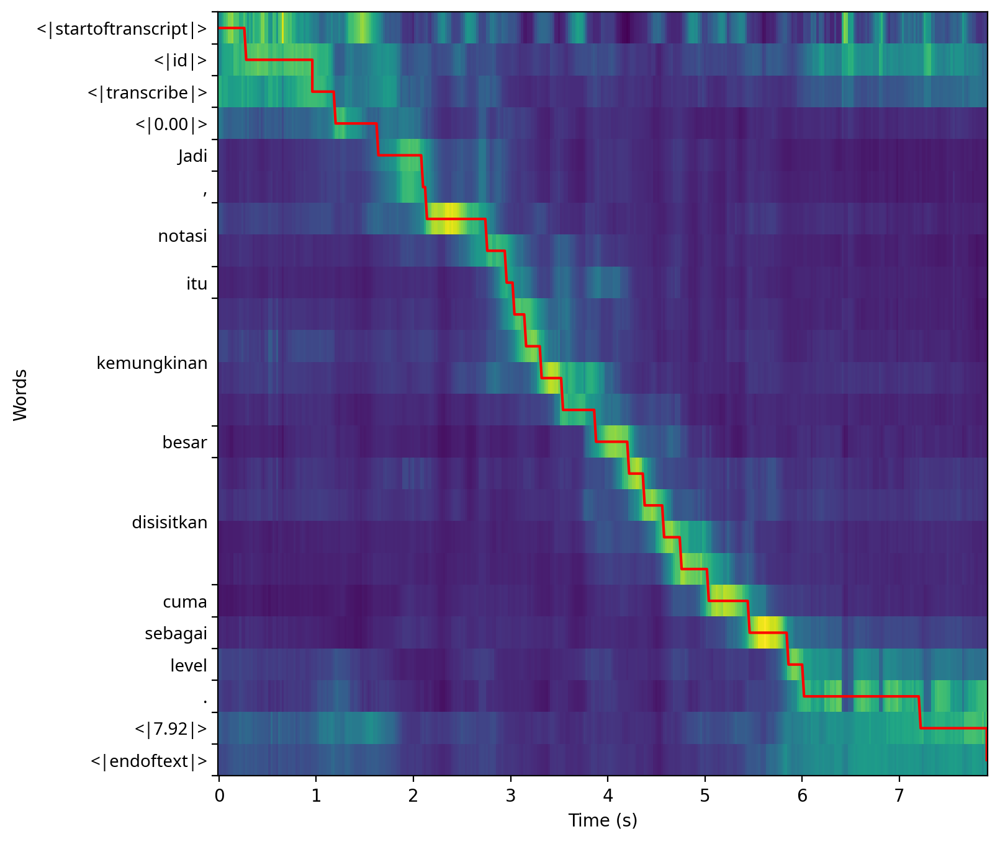

,word,begin,end
0,Jadi,1.64,2.10
1,notasi,2.14,2.96
2,itu,2.96,3.04
3,kemungkinan,3.04,3.88
4,besar,3.88,4.22
5,disisitkan,4.22,5.04
6,cuma,5.04,5.46
7,sebagai,5.46,5.86
8,level,5.86,6.02


 Namun, karena ditempatkan di dataran tinggi tropis hanya beberapa derajat di utara katulistiwa, Anda perlu berurusan dengan panas selalu maupun matahari yang kuat ketika langit cerah lebih jarang.


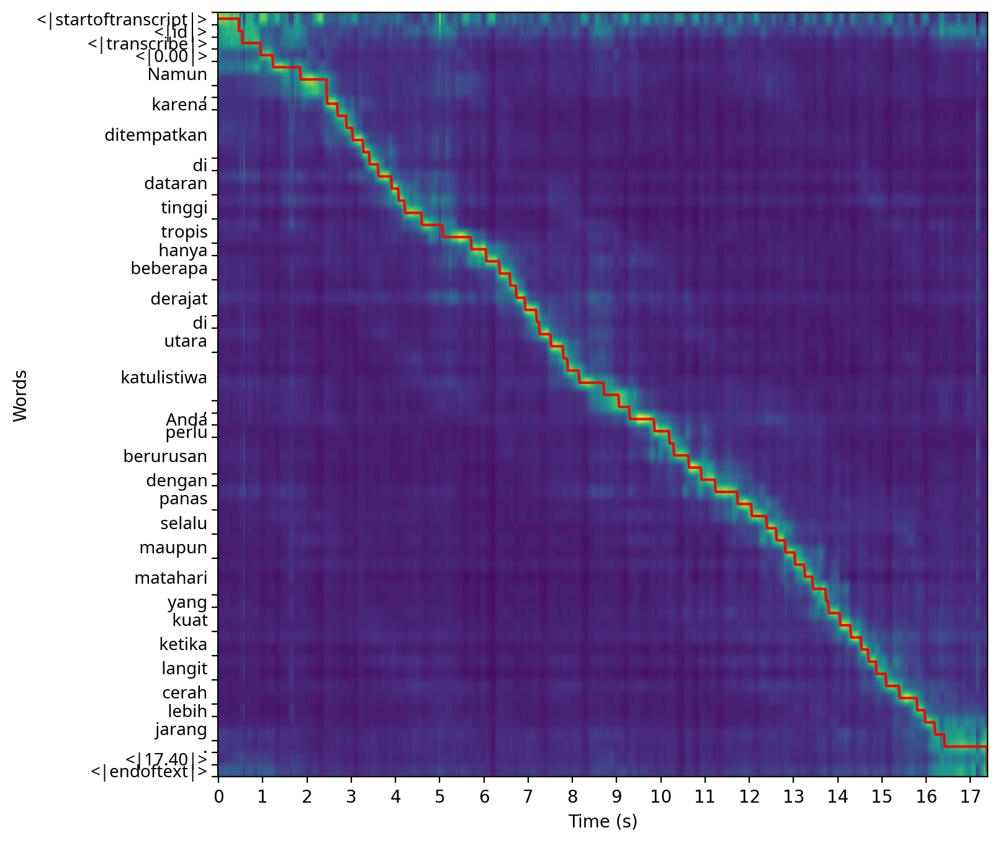

,word,begin,end
0,Namun,1.24,2.44
1,karena,2.46,2.70
2,ditempatkan,2.70,3.42
3,di,3.42,3.62
4,dataran,3.62,4.08
5,tinggi,4.08,4.60
6,tropis,4.60,5.72
7,hanya,5.72,6.06
8,beberapa,6.06,6.60
9,derajat,6.60,7.20


 Satelit itu dikirim ke luar angkasa oleh roket ilmuwan menggunakan teleskop di luar angkasa karena atas mosfair bumi mengubah sebagian cahaya dan pandangan kita.


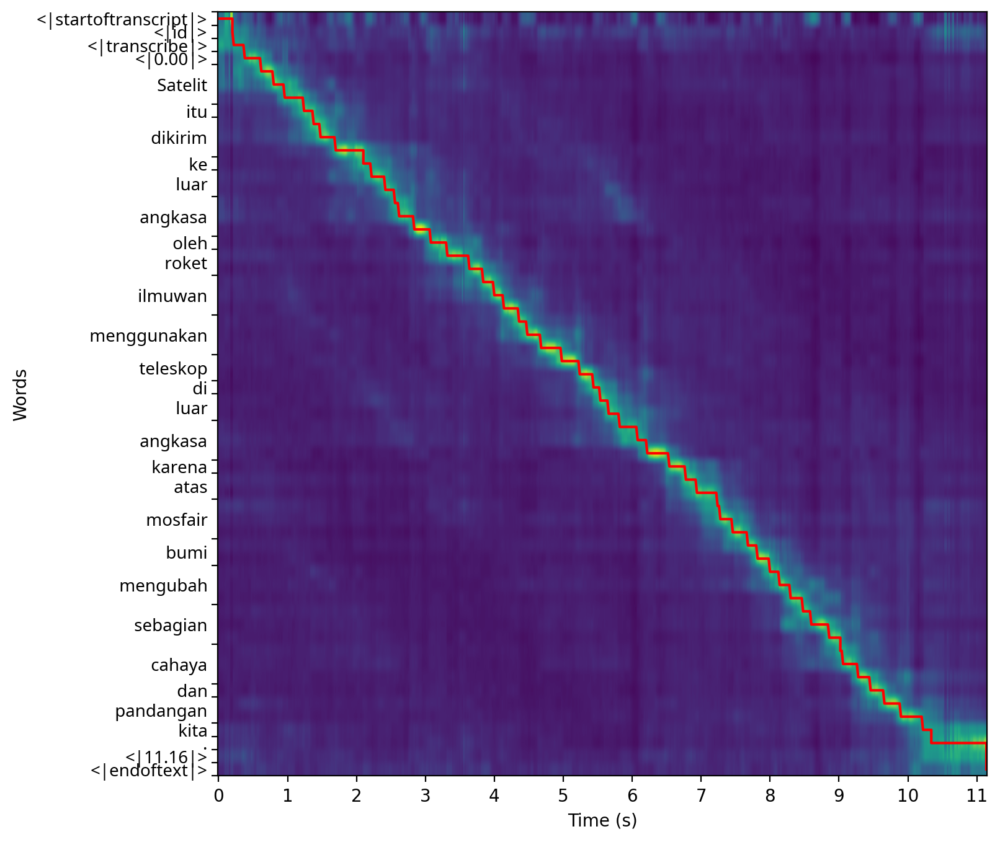

,word,begin,end
0,Satelit,0.62,1.24
1,itu,1.24,1.38
2,dikirim,1.38,2.10
3,ke,2.10,2.22
4,luar,2.22,2.56
5,angkasa,2.56,3.08
6,oleh,3.08,3.32
7,roket,3.32,3.84
8,ilmuwan,3.84,4.36
9,menggunakan,4.36,4.98


 Jangan mencorak sesuatu dengan mencorak-corak atau menghorekskan grafiti di bangunan.


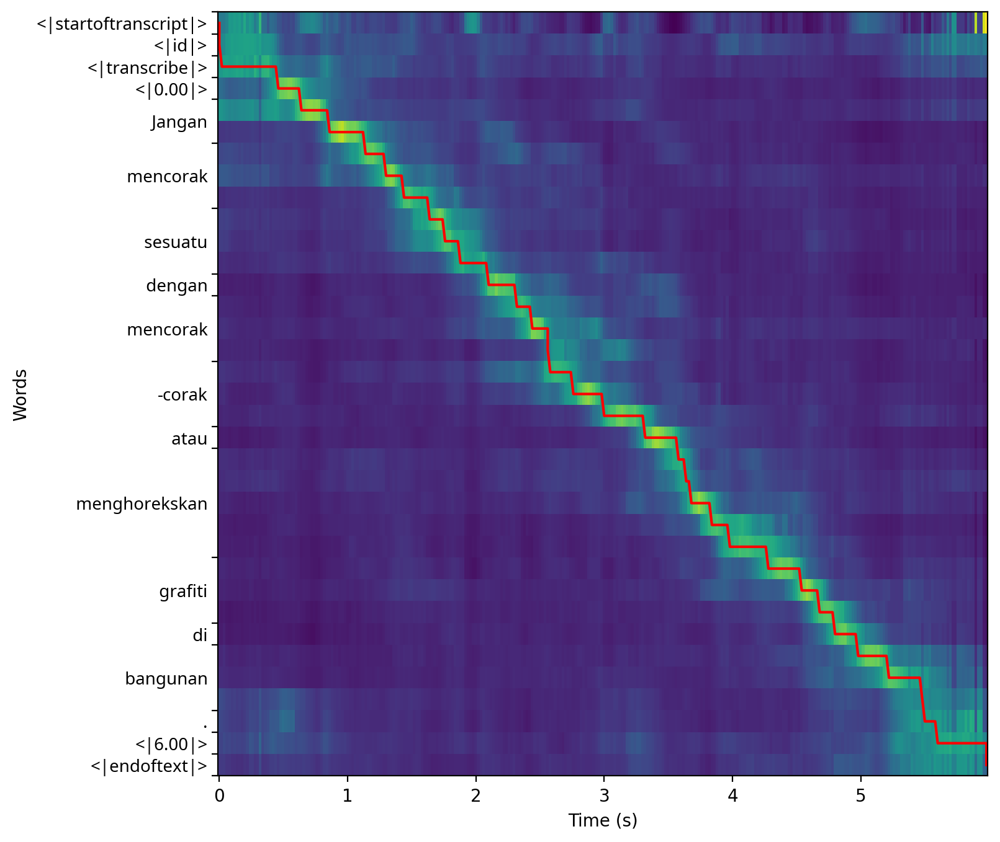

,word,begin,end
0,Jangan,0.64,1.14
1,mencorak,1.14,1.64
2,sesuatu,1.64,2.10
3,dengan,2.10,2.32
4,mencorak,2.32,2.58
5,-corak,2.58,3.32
6,atau,3.32,3.58
7,menghorekskan,3.58,4.28
8,grafiti,4.28,4.80
9,di,4.80,4.98


 Gereja-gereja tradisional sering mengadakan malam paskah pada sabtu malam selama akhir pekan paskah. Cemaat gereja semacam ini sering spontan merayakan kebangkitan Kristus saat tengah malam.


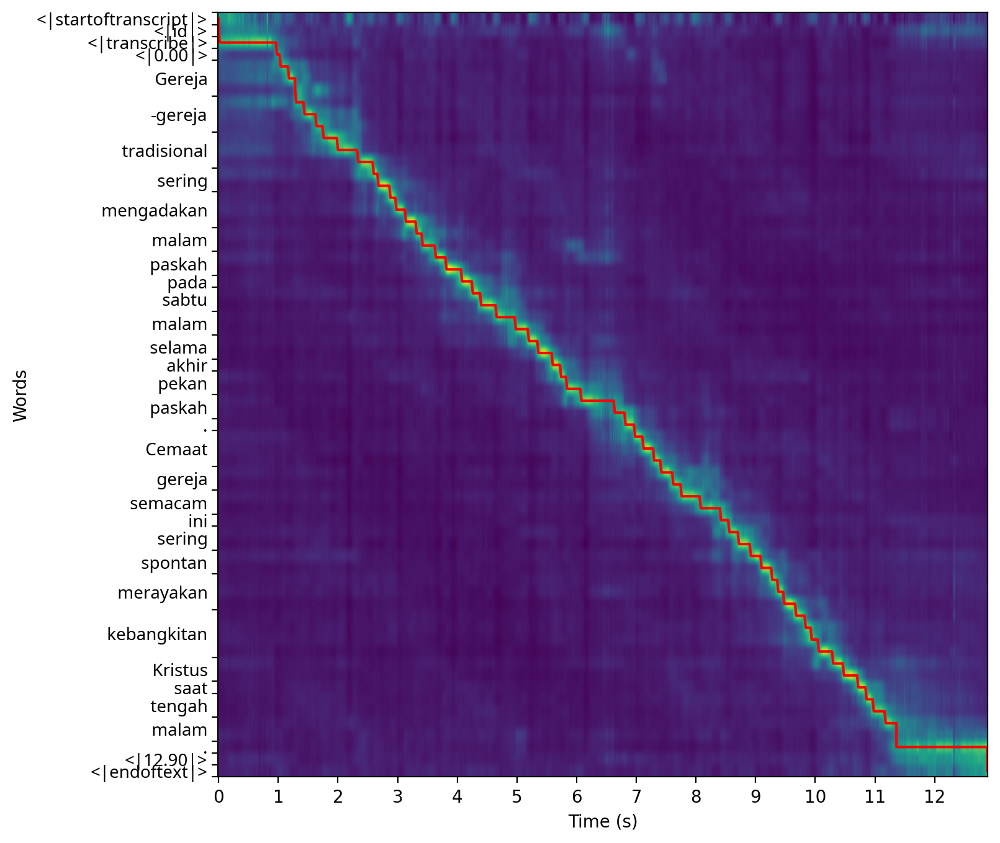

,word,begin,end
0,Gereja,1.04,1.30
1,-gereja,1.30,1.76
2,tradisional,1.76,2.60
3,sering,2.60,2.88
4,mengadakan,2.88,3.32
5,malam,3.32,3.64
6,paskah,3.64,4.08
7,pada,4.08,4.26
8,sabtu,4.26,4.66
9,malam,4.66,5.20


In [19]:
from whisper.model import disable_sdpa

# for the first 10 examples in the dataset
for (audio, label), transcription in zip(dataset, transcriptions[:10]):
    print(transcription)
  
    duration = len(audio)
    mel = whisper.log_mel_spectrogram(whisper.pad_or_trim(audio)).cuda()
    tokens = torch.tensor(
        [
            *tokenizer.sot_sequence,
            tokenizer.timestamp_begin,
        ] + tokenizer.encode(transcription) + [
            tokenizer.timestamp_begin + duration // AUDIO_SAMPLES_PER_TOKEN,
            tokenizer.eot,
        ]
    ).cuda()
    with torch.no_grad(), disable_sdpa():
        logits = model(mel.unsqueeze(0), tokens.unsqueeze(0))

    weights = torch.cat(QKs)  # layers * heads * tokens * frames    
    weights = weights[:, :, :, : duration // AUDIO_SAMPLES_PER_TOKEN].cpu()
    weights = median_filter(weights, (1, 1, 1, medfilt_width))
    weights = torch.tensor(weights * qk_scale).softmax(dim=-1)
    
    w = weights / weights.norm(dim=-2, keepdim=True)
    matrix = w[-6:].mean(axis=(0, 1))

    alignment = dtw(-matrix.double().numpy())

    jumps = np.pad(np.diff(alignment.index1s), (1, 0), constant_values=1).astype(bool)
    jump_times = alignment.index2s[jumps] * AUDIO_TIME_PER_TOKEN
    words, word_tokens = split_tokens(tokens)

    # display the normalized attention weights and the alignment
    plt.figure(figsize=(8, 8))
    plt.imshow(matrix, aspect="auto")
    plt.plot(alignment.index2s, alignment.index1s, color="red")

    xticks = np.arange(0, matrix.shape[1], 1 / AUDIO_TIME_PER_TOKEN)
    xticklabels = (xticks * AUDIO_TIME_PER_TOKEN).round().astype(np.int32) 
    plt.xticks(xticks, xticklabels)
    plt.xlabel("Time (s)")
    
    # display tokens and words as tick labels
    ylims = plt.gca().get_ylim()

    ax = plt.gca()
    ax.tick_params('both', length=0, width=0, which='minor', pad=6)

    ax.yaxis.set_ticks_position("left")
    ax.yaxis.set_label_position("left")
    ax.invert_yaxis()
    ax.set_ylim(ylims)

    major_ticks = [-0.5]
    minor_ticks = []
    current_y = 0
    
    for word, word_token in zip(words, word_tokens):
        minor_ticks.append(current_y + len(word_token) / 2 - 0.5)
        current_y += len(word_token)
        major_ticks.append(current_y - 0.5)
        
    ax.yaxis.set_minor_locator(ticker.FixedLocator(minor_ticks))
    ax.yaxis.set_minor_formatter(ticker.FixedFormatter(words))
    ax.set_yticks(major_ticks)
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    
    for label in ax.get_yminorticklabels():
        label.set_fontproperties(prop)

    plt.ylabel("Words")
    plt.show()

    # display the word-level timestamps in a table
    word_boundaries = np.pad(np.cumsum([len(t) for t in word_tokens[:-1]]), (1, 0))
    begin_times = jump_times[word_boundaries[:-1]]
    end_times = jump_times[word_boundaries[1:]]

    data = [
        dict(word=word, begin=begin, end=end)
        for word, begin, end in zip(words[:-1], begin_times, end_times)
        if not word.startswith("<|") and word.strip() not in ".,!?、。"
    ]

    display(pd.DataFrame(data))
    display(HTML("<hr>"))

## <h2><strong>Text-to-Speech using FastPitch and FastSpeech2</strong></h2>

Based on the notebook: <br>
https://github.com/coqui-ai/TTS/blob/dev/notebooks/Tutorial_1_use-pretrained-TTS.ipynb

In [2]:
!git clone https://github.com/coqui-ai/TTS.git

Cloning into 'TTS'...
remote: Enumerating objects: 32844, done.
remote: Total 32844 (delta 0), reused 0 (delta 0), pack-reused 32844 (from 1)
Receiving objects: 100% (32844/32844), 166.18 MiB | 17.92 MiB/s, done.
Resolving deltas: 100% (23832/23832), done.


In [3]:
import gdown
import os
os.chdir('/kaggle/working/TTS')

In [4]:
!pip install -q -U pip
!pip install -q TTS

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 49.6 MB/s eta 0:00:00:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 90.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 123.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 108.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 128.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 139.0 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 938.0/938.0 kB 31.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 M

In [5]:
!tts --list_models

RuntimeError: module was compiled against NumPy C-API version 0x10 (NumPy 1.23) but the running NumPy has C-API version 0xf. Check the section C-API incompatibility at the Troubleshooting ImportError section at https://numpy.org/devdocs/user/troubleshooting-importerror.html#c-api-incompatibility for indications on how to solve this problem.

 Name format: type/language/dataset/model
 1: tts_models/multilingual/multi-dataset/xtts_v2
 2: tts_models/multilingual/multi-dataset/xtts_v1.1
 3: tts_models/multilingual/multi-dataset/your_tts
 4: tts_models/multilingual/multi-dataset/bark
 5: tts_models/bg/cv/vits
 6: tts_models/cs/cv/vits
 7: tts_models/da/cv/vits
 8: tts_models/et/cv/vits
 9: tts_models/ga/cv/vits
 10: tts_models/en/ek1/tacotron2
 11: tts_models/en/ljspeech/tacotron2-DDC
 12: tts_models/en/ljspeech/tacotron2-DDC_ph
 13: tts_models/en/ljspeech/glow-tts
 14: tts_models/en/ljspeech/speedy-speech
 15: tts_models/en/ljspeech/tacotron2-DCA
 16: tts_models/en/ljspeech/vits
 17: tts_m

In [6]:
!tts --text "Text to Speech or TTS plays an important role in helping the economic sector to remind customers personally in an organized and effective manner." \
     --model_name "tts_models/en/ljspeech/fast_pitch" \
     --out_path output.wav

RuntimeError: module was compiled against NumPy C-API version 0x10 (NumPy 1.23) but the running NumPy has C-API version 0xf. Check the section C-API incompatibility at the Troubleshooting ImportError section at https://numpy.org/devdocs/user/troubleshooting-importerror.html#c-api-incompatibility for indications on how to solve this problem.
 > Downloading model to /root/.local/share/tts/tts_models--en--ljspeech--fast_pitch
 98%|██████████████████████████████████████▍| 451M/458M [00:11<00:00, 28.4MiB/s] > Model's license - apache 2.0
 > Check https://choosealicense.com/licenses/apache-2.0/ for more info.
 > Downloading model to /root/.local/share/tts/vocoder_models--en--ljspeech--hifigan_v2

100%|███████████████████████████████████████| 458M/458M [00:14<00:00, 31.1MiB/s]
 > Model's license - apache 2.0
 > Check https://choosealicense.com/licenses/apache-2.0/ for more info.
 > Using model: fast_pitch
 > Setting up Audio Processor...
 | > sample_rate:22050
 | > resample:False
 | > num_mel

In [7]:
import IPython
import torchaudio

audio, rate = torchaudio.load("output.wav")
IPython.display.Audio(audio, rate=rate)

<strong>FastSpeech2 from Speechbrain</strong>

In [8]:
!pip install -q speechbrain

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 824.8/824.8 kB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 722.2/722.2 kB 22.4 MB/s eta 0:00:00


In [9]:
import torchaudio
from speechbrain.inference.TTS import FastSpeech2
from speechbrain.inference.vocoders import HIFIGAN
from IPython.display import Audio

# Intialize TTS (FastSpeech2) and Vocoder (HiFIGAN)
fastspeech2 = FastSpeech2.from_hparams(source="speechbrain/tts-fastspeech2-ljspeech", savedir="pretrained_models/tts-fastspeech2-ljspeech")
hifi_gan = HIFIGAN.from_hparams(source="speechbrain/tts-hifigan-ljspeech", savedir="pretrained_models/tts-hifigan-ljspeech")

# Run TTS with text input
input_text = "Text to Speech or TTS plays an important role in helping the economic sector to remind customers personally in an organized and effective manner."

mel_output, durations, pitch, energy = fastspeech2.encode_text(
  [input_text],
  pace=1.0,        # scale up/down the speed
  pitch_rate=1.0,  # scale up/down the pitch
  energy_rate=1.0  # scale up/down the energy
)

# Running Vocoder (spectrogram-to-waveform)
waveforms = hifi_gan.decode_batch(mel_output)
audio = waveforms.squeeze(1)

# Save the waverform
# torchaudio.save('example_TTS_input_text.wav', audio, 22050)
Audio(audio, rate=22050)

hyperparams.yaml:   0%|          | 0.00/3.41k [00:00<?, ?B/s]

spn_predictor.ckpt:   0%|          | 0.00/76.4M [00:00<?, ?B/s]

model.ckpt:   0%|          | 0.00/181M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/speechbrain/utils/checkpoints.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(path, map_location=device

hyperparams.yaml:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

model.ckpt:   0%|          | 0.00/129M [00:00<?, ?B/s]

ctc_lin.ckpt:   0%|          | 0.00/177k [00:00<?, ?B/s]

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


hyperparams.yaml:   0%|          | 0.00/1.16k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


generator.ckpt:   0%|          | 0.00/55.8M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/speechbrain/utils/checkpoints.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(path, map_location=device

## <h2><strong>Text-to-Speech Indonesian</strong></h2>

Folder: https://drive.google.com/drive/folders/1HPFh0AWeGqC5VIwUJMICDv4G4VK3VdNI?usp=sharing

Checkpoint File: https://drive.google.com/file/d/1F2qNo4PXdjhbIXivbIvtZSF1B6pcDBS0/view?usp=sharing

Config File: https://drive.google.com/file/d/1IjGQSivq2Rejjln5ePy-pZbd3mRy542u/view?usp=sharing

Speaker File: https://drive.google.com/file/d/1M5gGPyNs8yp4b2y761N8EGbpkhu5p-ay/view?usp=sharing

In [10]:
!pip install -q git+https://github.com/Wikidepia/g2p-id

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 99.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.5/897.5 kB 22.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
preprocessing 0.1.13 requires nltk==3.2.4, but you have nltk 3.9.1 which is incompatible.


In [11]:
import gdown

In [12]:
# Checkpoint
file_id = '1F2qNo4PXdjhbIXivbIvtZSF1B6pcDBS0'
url = f'https://drive.google.com/uc?id={file_id}'

gdown.download(url, 'checkpoint_1260000-inference.pth', quiet=True)

'checkpoint_1260000-inference.pth'

In [13]:
# Config
file_id = '1IjGQSivq2Rejjln5ePy-pZbd3mRy542u'
url = f'https://drive.google.com/uc?id={file_id}'

gdown.download(url, 'config.json', quiet=True)

'config.json'

In [14]:
# Speakers
file_id = '1M5gGPyNs8yp4b2y761N8EGbpkhu5p-ay'
url = f'https://drive.google.com/uc?id={file_id}'

gdown.download(url, 'speakers.pth', quiet=True)

'speakers.pth'

In [15]:
original = "STT adalah teknologi yang memungkinkan kita untuk mengubah ucapan menjadi teks tertulis. Teknologi ini sangat berguna bagi mereka yang ingin mengetik secara lebih cepat dan efisien dengan suara."

In [16]:
from g2p_id import G2P

g2p = G2P()
g2p(original)

'stt aˈdalah teʔnoˈloɡi jaŋ məmuŋˈkinkan ˈkita ˈuntʊʔ məˈŋubah uˈtʃapan mənˈdʒadi tɛks tərˈtulɪs. teʔnoˈloɡi ˈini ˈsaŋat bərˈɡuna ˈbaɡi məˈreka jaŋ ˈiŋɪn məŋəˈtiʔ səˈtʃara ləˈbih tʃəˈpat dan ɛfiˈsiɛn dəˈŋan suˈara.'

In [17]:
!tts --text 'stt aˈdalah teʔnoˈloɡi jaŋ məmuŋˈkinkan ˈkita ˈuntʊʔ məˈŋubah uˈtʃapan mənˈdʒadi tɛks tərˈtulɪs. teʔnoˈloɡi ˈini ˈsaŋat bərˈɡuna ˈbaɡi məˈreka jaŋ ˈiŋɪn məŋəˈtiʔ səˈtʃara ləˈbih tʃəˈpat dan ɛfiˈsiɛn dəˈŋan suˈara.' \
     --model_path checkpoint_1260000-inference.pth \
     --config_path config.json \
     --speaker_idx wibowo \
     --out_path out-indonesian.wav

RuntimeError: module was compiled against NumPy C-API version 0x10 (NumPy 1.23) but the running NumPy has C-API version 0xf. Check the section C-API incompatibility at the Troubleshooting ImportError section at https://numpy.org/devdocs/user/troubleshooting-importerror.html#c-api-incompatibility for indications on how to solve this problem.
 > Using model: vits
 > Setting up Audio Processor...
 | > sample_rate:22050
 | > resample:False
 | > num_mels:80
 | > log_func:np.log10
 | > min_level_db:0
 | > frame_shift_ms:None
 | > frame_length_ms:None
 | > ref_level_db:None
 | > fft_size:1024
 | > power:None
 | > preemphasis:0.0
 | > griffin_lim_iters:None
 | > signal_norm:None
 | > symmetric_norm:None
 | > mel_fmin:0
 | > mel_fmax:None
 | > pitch_fmin:None
 | > pitch_fmax:None
 | > spec_gain:20.0
 | > stft_pad_mode:reflect
 | > max_norm:1.0
 | > clip_norm:True
 | > do_trim_silence:False
 | > trim_db:60
 | > do_sound_norm:False
 | > do_amp_to_db_linear:True
 | > do_amp_to_db_mel:True
 | > do_

In [18]:
import IPython
import torchaudio

audio, rate = torchaudio.load("out-indonesian.wav")
IPython.display.Audio(audio, rate=rate)

## <h2><strong>Speaker Recognition using Deep Speaker</strong></h2>

In [2]:
!git clone https://github.com/philipperemy/deep-speaker.git

Cloning into 'deep-speaker'...
remote: Enumerating objects: 2114, done.
remote: Counting objects: 100% (227/227), done.
remote: Compressing objects: 100% (112/112), done.
remote: Total 2114 (delta 113), reused 187 (delta 104), pack-reused 1887 (from 1)
Receiving objects: 100% (2114/2114), 81.51 MiB | 41.42 MiB/s, done.
Resolving deltas: 100% (1102/1102), done.


In [3]:
import os
os.chdir("/kaggle/working/deep-speaker")

In [4]:
!pip install -q -r requirements.txt

  Preparing metadata (setup.py) ... done


In [5]:
!pip install -q tensorflow==2.12.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 2.4 MB/s eta 0:00:00:00:01m0:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 43.8 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 68.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 7.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 594.0 kB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 91.8 kB/s eta 0:00:00a 0:00:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.16 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
albumentations 1.4.15 requires numpy>=1.24.4, but you have numpy 1.23.5 which is incompatible.
bayesian-optimization 2.0.1 requires numpy>=1.25, but you have numpy 1.23.5 which is incompatible.
bigframes 1.17.0

In [6]:
import random
import numpy as np
import gdown
import h5py

from deep_speaker.audio import read_mfcc
from deep_speaker.batcher import sample_from_mfcc
from deep_speaker.constants import SAMPLE_RATE, NUM_FRAMES
from deep_speaker.conv_models import DeepSpeakerModel
from deep_speaker.test import batch_cosine_similarity

In [7]:
# Reproducible results
# To have reproducible results every time you call this function, set the seed every time before calling it.
# np.random.seed(123)
# random.seed(123)
np.random.seed(42)
random.seed(42)

In [8]:
# Load the checkpoint. https://drive.google.com/file/d/1F9NvdrarWZNktdX9KlRYWWHDwRkip_aP.
file_id = '1F9NvdrarWZNktdX9KlRYWWHDwRkip_aP'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'ResCNN_triplet_training_checkpoint_265.h5'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1F9NvdrarWZNktdX9KlRYWWHDwRkip_aP
To: /kaggle/working/deep-speaker/ResCNN_triplet_training_checkpoint_265.h5
100%|██████████| 97.1M/97.1M [00:03<00:00, 31.9MB/s]


'ResCNN_triplet_training_checkpoint_265.h5'

In [9]:
file_path='ResCNN_triplet_training_checkpoint_265.h5'
try:
    with h5py.File(file_path, 'r') as f:
        print("File opened successfully.")
        print(f.keys())
except OSError:
    print("Error: Unable to open the file.")

File opened successfully.
<KeysViewHDF5 ['model_weights', 'optimizer_weights']>


In [10]:
# Define the model here.
model = DeepSpeakerModel()
model.m.load_weights(file_path, by_name=True)

In [11]:
# Sample some inputs for WAV/FLAC files for the same speaker.
mfcc_001 = sample_from_mfcc(read_mfcc('samples/PhilippeRemy/PhilippeRemy_001.wav', SAMPLE_RATE), NUM_FRAMES)
mfcc_002 = sample_from_mfcc(read_mfcc('samples/PhilippeRemy/PhilippeRemy_002.wav', SAMPLE_RATE), NUM_FRAMES)

In [12]:
# Call the model to get the embeddings of shape (1, 512) for each file.
predict_001 = model.m.predict(np.expand_dims(mfcc_001, axis=0))
predict_002 = model.m.predict(np.expand_dims(mfcc_002, axis=0))

1/1 [==============================] - 0s 95ms/step


In [13]:
# Do it again with a different speaker.
mfcc_003 = sample_from_mfcc(read_mfcc('samples/1255-90413-0001.flac', SAMPLE_RATE), NUM_FRAMES)
predict_003 = model.m.predict(np.expand_dims(mfcc_003, axis=0))

1/1 [==============================] - 0s 98ms/step


In [14]:
# Compute the cosine similarity and check that it is higher for the same speaker.
print('SAME SPEAKER', batch_cosine_similarity(predict_001, predict_002))
print('DIFF SPEAKER', batch_cosine_similarity(predict_001, predict_003))

SAME SPEAKER [0.72540534]
DIFF SPEAKER [0.03503535]
